**First, we import all the libraries that we will be using in this section**

In [1]:
#pip install opencv-python mediapipe --user msvc-runtime

In [2]:
import FeaturesExtracts
import pickle
import numpy as np
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
#...............................................


**All file paths that we will use**

In [3]:
model_path=r"models\svm_rbf_c_100.sav" #  svm_rbf_c_100.sav model OR mlp_categorical_crossentropy_50.sav model


scaler_path=r"models\scaler.sav"
encoder_path=r"models\encoder.sav"
image_path=r"..\data\data test\\"

#...............................................


**Load scaler in the Classification section**

In [4]:
scaler = pickle.load(open(scaler_path, 'rb'))

**Load encoder in the Classification section**

In [5]:
encoder = pickle.load(open(encoder_path, 'rb'))

**Load the trainer model in the Classification section**

In [6]:
model = pickle.load(open(model_path, 'rb'))

**A function that predicts the signal in an image or a frame and writes the name of the class that the model is predicting**

In [7]:
def Detection_Image(Image_or_Frame):
    res=hands.process(cv2.cvtColor(Image_or_Frame, cv2.COLOR_BGR2RGB))    
    if res.multi_hand_landmarks:
        
            IsLeftHand=res.multi_handedness[0].classification[0].label=="Right"
            Fetuers=FeaturesExtracts.HandFetuers.GetFeteuers(res.multi_hand_landmarks[0].landmark, IsLeftHand) 
            Fetuers=scaler.transform(Fetuers)
            
            mp_draw.draw_landmarks(Image_or_Frame, res.multi_hand_landmarks[0], mp.solutions.hands.HAND_CONNECTIONS,
                                   connection_drawing_spec=mp_draw.DrawingSpec(color=(0,255,0))
                                  )
            lable=encoder.inverse_transform(model.predict(Fetuers))
            cv2.putText(Image_or_Frame,lable[0],(int(Image_or_Frame.shape[1]/2),60),
                                               cv2.FONT_HERSHEY_SIMPLEX,1.5,(0,0,255),3
                            )
                
                
#...............................................  


**prediction by image**

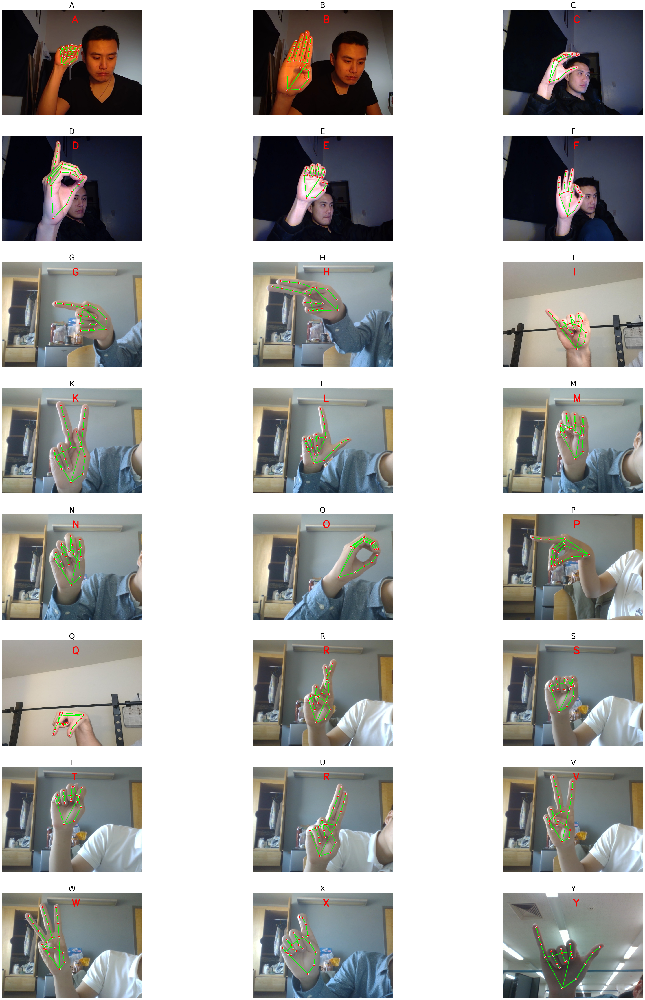

In [8]:
hands=mp.solutions.hands.Hands(static_image_mode=True,max_num_hands=1,min_detection_confidence=0.7)
mp_draw=mp.solutions.drawing_utils

names=[chr(i) for i in range(65,91)]
names.remove('Z')
names.remove('J')
plt.figure(figsize=(50,70))
for i in range(len(names)):
    
    plt.subplot(8,3,i+1)
    Image=cv2.imread(image_path+names[i]+'.jpg')
    Image=cv2.resize(Image,(640, 480))
    Detection_Image(Image_or_Frame=Image)
    Image=cv2.cvtColor(Image, cv2.COLOR_BGR2RGB)
    plt.imshow(Image)
    plt.axis('off')
    plt.title(names[i],fontsize=30)
    

plt.show()    
    
hands.close()
del mp_draw


#...............................................
